Goal: 利用 Detr 進行物件偵測任務，目前挑選番茄資料集進行偵測，判斷是否成熟。  
[Detr finetune notebook](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-huggingface-detr-on-custom-dataset.ipynb)  
[Kaggle example](https://www.kaggle.com/code/kirollosashraf/tomato-fruit-detection/notebook)  
[tomatOD dataset](https://datasetninja.com/tomatod)

## Before start
The notebook annoted in previous are encouraged to train in GPU, so first check the setting.

In [1]:
!nvidia-smi

Wed May 28 04:25:08 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   54C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


Download the depencies

In [3]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 47.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 97.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 61.9 MB/s eta

In [ ]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

# !pip install --upgrade supervision

import supervision
import transformers
import pytorch_lightning

print(
    "; supervision:", supervision.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__
)

In [ ]:
#OS libs
import os
import shutil
import itertools
import pathlib
from PIL import Image

#Data handling tools
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('whitegrid')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix , classification_report

import torch
import supervision as sv
from transformers import DetrForObjectDetection, DetrImageProcessor
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler

Load the model

In [ ]:
# settings
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)

## Dataset 
### Kaggle tomato fruit detection
Since my data is derived from kaggle [Tomato fruit detection](https://www.kaggle.com/datasets/nexuswho/tomatofruits), so I use the command to `unzip` the dataset.  
* Uploading zip file is more efficient that directly uploading image folder.
* There are 2 categories, I choose the ternary classes one.

In [ ]:
!unzip tomato.zip

analyze data in dataframe

In [ ]:
train_data_path = './Three Classes'

def wrap_in_dataframe(data_path):
  filepaths =[]
  labels = []

  folds = os.listdir(data_path) # [reject, unripe, ripe] expected

  for fold in folds:
      f_path = os.path.join(data_path , fold) # create subfolder path
      filelists = os.listdir(f_path)  # access files

      for file in filelists:
          filepaths.append(os.path.join(f_path , file))
          labels.append(fold) # fold is indicated as label

  #Concat data paths with labels
  Fseries = pd.Series(filepaths , name = 'filepaths')
  Lseries = pd.Series(labels , name = 'label')
  train_df = pd.concat([Fseries , Lseries] , axis = 1)

  return train_df

train_df = wrap_in_dataframe(train_data_path)
print(f"total num of datas: {len(train_df)}")
print(train_df.head())
# print the label distribution
label_counts = train_df['label'].value_counts()
print(label_counts)

total num of datas: 2400
                                 filepaths label
0   ./Three Classes/Ripe/healthy (992).jpg  Ripe
1   ./Three Classes/Ripe/healthy (894).jpg  Ripe
2   ./Three Classes/Ripe/healthy (726).jpg  Ripe
3  ./Three Classes/Ripe/healthy (1123).jpg  Ripe
4  ./Three Classes/Ripe/healthy (1236).jpg  Ripe
label
Ripe      800
Reject    800
Unripe    800
Name: count, dtype: int64


divide into train and test dataset

In [ ]:
train , test = train_test_split(train_df , train_size = 0.3 , shuffle = True , random_state= 42)

Test inference

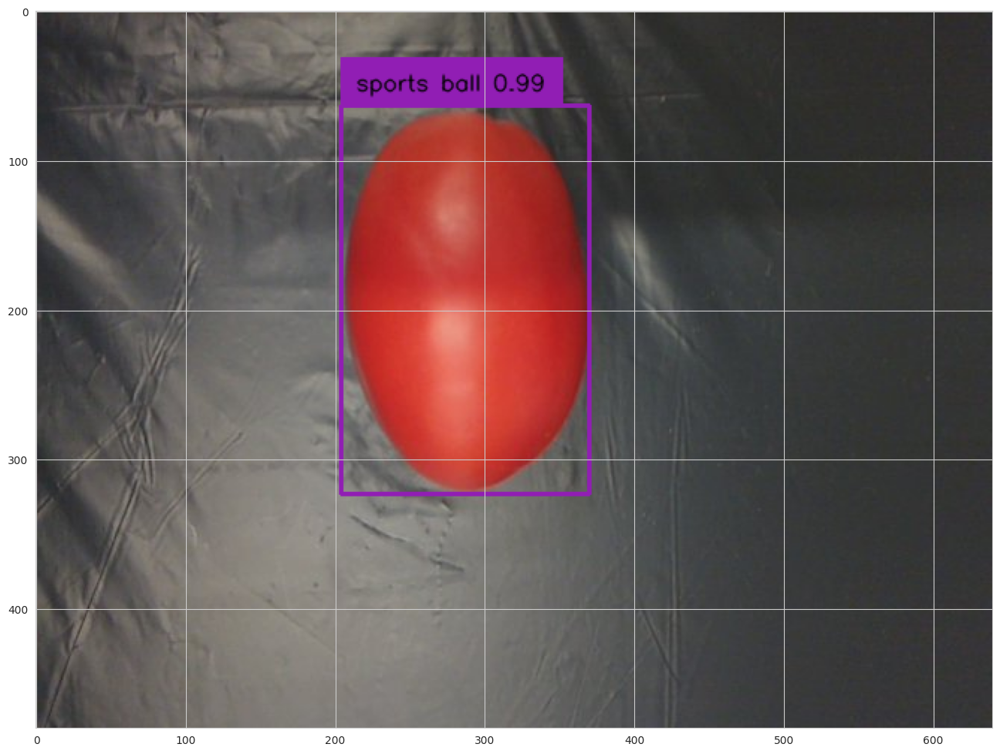

In [ ]:
IMAGE_PATH = './Three Classes/Ripe/healthy (986).jpg' # pick any from dataset
with torch.no_grad():

    # load image and predict
    image = cv2.imread(IMAGE_PATH)
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results)
# annotate with NMS use the following:
# detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_TRESHOLD)

labels = [
    f"{model.config.id2label[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

居然是可以辨識出來的，雖然分類結果錯誤。

用 DETR 自動標註資料，將來拿來訓練 bbox 資訊用。

In [ ]:
import os
import json
import cv2
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import supervision as sv
from PIL import Image

def auto_annotate_images_by_detr(
    image_folder,
    output_json,
    model,
    image_processor,
    device,
    confidence_threshold=0.5,
    iou_threshold=0.5,
    visualize=True
):
    annotation_dict = {}

    image_files = [f for f in os.listdir(image_folder) if f.lower().endswith((".jpg", ".png", ".jpeg"))]
    label = os.path.split(image_folder)[-1]

    for image_file in image_files:
        image_path = os.path.join(image_folder, image_file)
        print(f"[INFO] Processing {image_file} ...")

        # 讀圖
        image = cv2.imread(image_path)
        if image is None:
            print(f"⚠️ Failed to read {image_file}, skipping.")
            continue

        with torch.no_grad():
            # 前處理與預測
            inputs = image_processor(images=image, return_tensors="pt").to(device)
            outputs = model(**inputs)

            # 後處理：取得 bbox + label
            target_sizes = torch.tensor([image.shape[:2]]).to(device)
            results = image_processor.post_process_object_detection(
                outputs=outputs,
                threshold=confidence_threshold,
                target_sizes=target_sizes
            )[0]

        # 用 Supervision 取得 bbox 結果
        detections = sv.Detections.from_transformers(transformers_results=results)#.with_nms(threshold=iou_threshold)

        # 每張圖的標註資訊
        boxes = []
        missing_detections = []  # 新增記錄 list

        if len(detections.xyxy) > 0:
          # 找出最高信心的 bbox
          max_conf_idx = np.argmax(detections.confidence).item()

          xyxy = detections.xyxy[max_conf_idx]
          class_id = detections.class_id[max_conf_idx]
          confidence = detections.confidence[max_conf_idx]

          x1, y1, x2, y2 = map(int, xyxy)
          boxes.append({
              "bbox": [x1, y1, x2, y2],
              "label": label,  # 資料夾名稱代表這個分類結果
              "confidence": float(confidence)
          })
          annotation_dict[image_file] = boxes
        else:
          print(f"[WARNING] No bbox detected for {image_file}")
          missing_detections.append(image_file)

          # 如果你想把這張圖另存到一個資料夾（例如 `missed/`）方便檢查：
          missed_dir = os.path.join(image_folder, "missed")
          os.makedirs(missed_dir, exist_ok=True)
          cv2.imwrite(os.path.join(missed_dir, image_file), image)


        # 顯示可視化
        if visualize:
            fig, ax = plt.subplots(1)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            ax.imshow(image_rgb)
            for box in boxes:
                x1, y1, x2, y2 = box["bbox"]
                rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                         linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                ax.text(x1, y1 - 5, box["label"], color="white", fontsize=8,
                        bbox=dict(facecolor="red", alpha=0.5))
            plt.title(f"Annotated: {image_file}")
            plt.show()

    # 寫入 JSON
    with open(output_json, "w") as f:
        json.dump(annotation_dict, f, indent=2)
    print(f"[DONE] Annotation file written to: {output_json}")

In [ ]:
# image_folder = "./Three Classes/Ripe"  # 可針對某一類資料夾自動標註
# output_json = "auto_annotations_ripe.json"

# auto_annotate_images_by_detr(
#     image_folder=image_folder,
#     output_json=output_json,
#     model=model,
#     image_processor=image_processor,
#     device=DEVICE,
#     confidence_threshold=0.8,
#     iou_threshold=0.8,
#     visualize=True  # 會顯示每張圖標註結果
# )

上面理論上可行，但是要跑很久，改用其他資料集比較省事。  
mini-test: DETR 可以對蕃茄預測出 bbox ，但是它原本所訓練的標籤並沒有`tomato`這個選項，因此會亂分類。 

### tomatOD
[tomatOD](https://datasetninja.com/tomatod#citation)  
[tomatOD github](https://github.com/up2metric/tomatOD)

In [ ]:
# import dataset_tools as dtools

# dtools.download(dataset='tomatOD', dst_dir='~/dataset-ninja/')

# # root_path = /root/dataset-ninja/tomatod

In [ ]:
# !tar -xvf /root/dataset-ninja/tomatod-DatasetNinja.tar

!tar -xvf /content/tomatod-DatasetNinja.tar

Test infernece for tomatOD

/content/Train/img/stereo20190405_133623_p0_snap_136.jpg
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 17.3 MB/s eta 0:00:00
  Attempting uninstall: supervision
    Found existing installation: supervision 0.3.0
    Uninstalling supervision-0.3.0:
      Successfully uninstalled supervision-0.3.0


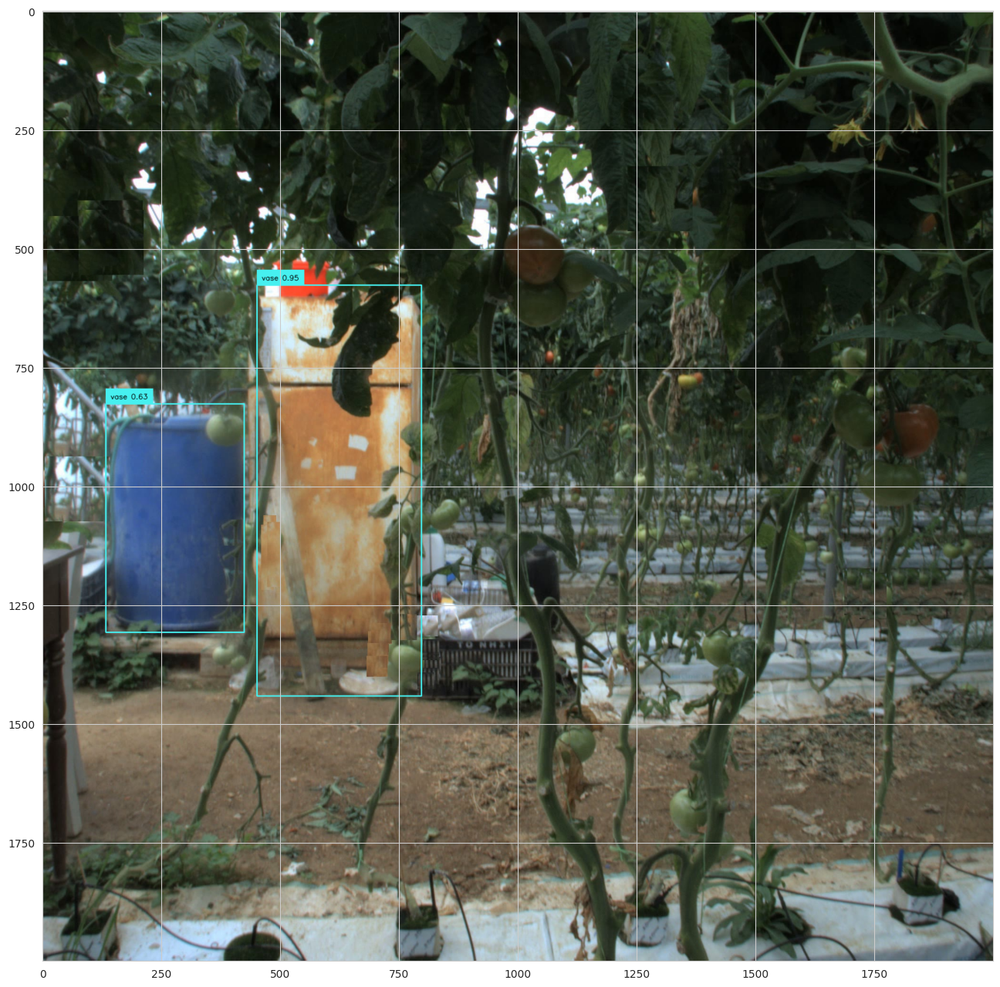

In [8]:
# root_path = '/root/dataset-ninja/tomatod'
root_path = "/content"
train_path = root_path + '/Train/img'

images = os.listdir(train_path)[0]
IMAGE_PATH = os.path.join(train_path, images)
print(IMAGE_PATH)

with torch.no_grad():

    # load image and predict
    image = cv2.imread(IMAGE_PATH)
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results)
# annotate with NMS use the following:
# detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_TRESHOLD)

labels = [
    f"{model.config.id2label[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
!pip install --upgrade supervision
sv.show_frame_in_notebook(frame, (16, 16))

這個就沒有很準，很需要finetune。

disply the ground true result

image file path: /content/Train/img/stereo20190406_054921_p0_snap_670.jpg
json file path: /content/Train/ann/stereo20190406_054921_p0_snap_670.jpg.json
圖片大小: 2000x2000
物件類別: fully-ripe, bbox: (1120, 864), (1246, 990)
物件類別: unripe, bbox: (545, 1397), (687, 1539)
物件類別: semi-ripe, bbox: (614, 1323), (756, 1465)
物件類別: unripe, bbox: (562, 1796), (662, 1896)
物件類別: unripe, bbox: (657, 1819), (757, 1919)


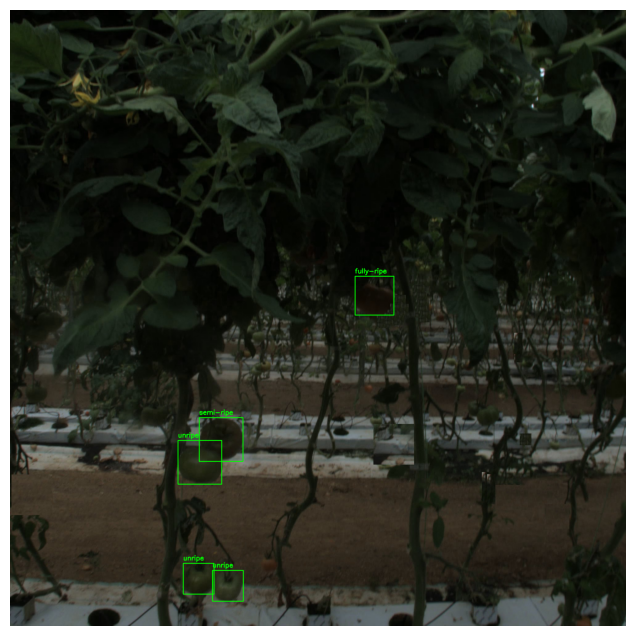

In [9]:
import cv2
import json

def visualize_annotation(image_path, json_path):
    # 讀取圖片
    img = cv2.imread(image_path)
    if img is None:
        print("Error: 讀取圖片失敗")
        return

    # 讀取 annotation JSON
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 取得圖片大小（以防萬一確認跟 annotation 一致）
    img_height, img_width = img.shape[:2]
    print(f"圖片大小: {img_width}x{img_height}")

    # 解析並繪製每個物件的 bbox
    for obj in data['objects']:
        class_name = obj['classTitle']

        # 取得 bbox 左上與右下點座標 (x1,y1), (x2,y2)
        (x1, y1), (x2, y2) = obj['points']['exterior']

        # 印出 bbox 資訊
        print(f"物件類別: {class_name}, bbox: ({x1}, {y1}), ({x2}, {y2})")

        # 繪製矩形框
        pt1 = (int(x1), int(y1))
        pt2 = (int(x2), int(y2))
        cv2.rectangle(img, pt1, pt2, color=(0, 255, 0), thickness=2)

        # 標註類別文字，位置在左上角
        cv2.putText(img, class_name, (pt1[0], pt1[1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    # 顯示圖片視窗
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

# 範例呼叫
if __name__ == "__main__":
    # train_path = '/root/dataset-ninja/tomatod/Train/'
    train_path = '/content/Train/'
    image_path = os.path.join(train_path+ "img", os.listdir(train_path + "img")[-1])
    json_path = os.path.join(train_path + "ann", os.listdir(train_path + "img")[-1] + ".json")
    print(f"image file path: {image_path}")
    print(f"json file path: {json_path}")
    visualize_annotation(image_path, json_path)


Create dataset

In [10]:
import json
class TomatoDataset():
    def __init__(self, img_dir, ann_dir, image_processor, label_map=None):
        self.img_dir = img_dir
        self.ann_dir = ann_dir
        self.image_processor = image_processor
        self.image_label_pairs = []

        self.image_files = sorted([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))])

        # 建立類別對應編號
        self.label_map = label_map or {"fully-ripe": 0, "semi-ripe": 1, "unripe": 2}

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_filename = self.image_files[idx]
        image_path = os.path.join(self.img_dir, image_filename)
        ann_path = os.path.join(self.ann_dir, image_filename + ".json")

        # 讀圖片
        image = Image.open(image_path).convert("RGB")
        width, height = image.size

        # 預處理
        encoding = self.image_processor(images=image, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze(0)

        # 讀標註
        with open(ann_path, "r") as f:
            ann = json.load(f)

        boxes = []
        class_ids = []

        for obj in ann["objects"]:
            class_name = obj["classTitle"]
            class_id = self.label_map[class_name]

            x0, y0 = obj["points"]["exterior"][0]
            x1, y1 = obj["points"]["exterior"][1]
            # xyxy 格式
            boxes.append([x0, y0, x1, y1])
            class_ids.append(class_id)

        # Tensor 轉換
        boxes = torch.tensor(boxes, dtype=torch.float32)
        class_ids = torch.tensor(class_ids, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "class_labels": class_ids,
        }

        return pixel_values, target

# train_root_path = '/root/dataset-ninja/tomatod/Train/img'
# test_root_path = '/root/dataset-ninja/tomatod/Test/img'
train_root_path = '/content/Train/img'
test_root_path = '/content/Test/img'

train_dataset = TomatoDataset(
    # img_dir='/root/dataset-ninja/tomatod/Train/img',
    # ann_dir='/root/dataset-ninja/tomatod/Train/ann',
    img_dir='/content/Train/img',
    ann_dir='/content/Train/ann',
    image_processor=image_processor
)

# train valid split
train_length=int(0.8* len(train_dataset))
val_length=len(train_dataset)-train_length
train_dataset, val_dataset=torch.utils.data.random_split(train_dataset,(train_length,val_length))

test_dataset = TomatoDataset(
    # img_dir='/root/dataset-ninja/tomatod/Test/img',
    # ann_dir='/root/dataset-ninja/tomatod/Test/ann',
    img_dir='/content/Test/img',
    ann_dir='/content/Test/ann',
    image_processor=image_processor
)

def collate_fn(batch):
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]

    # 使用 image_processor 處理
    encoding = image_processor.pad(pixel_values, return_tensors="pt")

    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False, collate_fn=collate_fn)

print("Number of training examples:", len(train_dataset))
print("Number of valiational examples:", len(val_dataloader))
print("Number of testing examples:", len(test_dataset))

Number of training examples: 177
Number of valiational examples: 6
Number of testing examples: 55


finetune

In [11]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch

label2id = {"fully-ripe": 0, "semi-ripe": 1, "unripe": 2}
id2label = {v: k for k, v in label2id.items()}

class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=len(id2label),
            id2label=id2label,
            label2id={v: k for k, v in id2label.items()},
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        if pixel_mask is not None:
            return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)
        else:
            return self.model(pixel_values=pixel_values)
        # return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        # pixel_mask = batch["pixel_mask"]
        # labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        # outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        # DETR 不一定需要 pixel_mask，除非用了 padding
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]
        # pixel_mask = batch["pixel_mask"]
        outputs = self.model(pixel_values=pixel_values, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        # acc
        # outputs = self.model(pixel_values=batch["pixel_values"])
        # preds = outputs.logits.argmax(-1)  # 假設用 argmax 預測類別
        # labels = torch.tensor([label_tensor["class_labels"] for label_tensor in batch["labels"]]).to(self.device)
        # acc = (preds == labels).float().mean()
        # self.log("validation_acc", acc, prog_bar=True)

        return {'val_loss': loss}

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    # 訓練跟驗證要用到的
    def train_dataloader(self):
        return train_dataloader

    def val_dataloader(self):
        return val_dataloader

In [12]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(train_dataloader))
outputs = model(
    pixel_values=batch['pixel_values'],
    pixel_mask=batch.get("pixel_mask", None)
)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [13]:
outputs.logits.shape

torch.Size([8, 100, 4])

In [ ]:
from pytorch_lightning import Trainer

%cd {HOME}

# settings
MAX_EPOCHS = 50  # modify at any

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
# trainer = Trainer(devices=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)
trainer = Trainer(devices=1, accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.


/content


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params | Mode
--------------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M | eval
--------------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.009   Total estimated model params size (MB)
0         Modules in train mode
399       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:476: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.11/dist-packages/pytorch_lightning/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/pytorch_lightning/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 5. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

TensorBoard 裡你能看到什麼？
* Lightning 會自動把你在 self.log("val_mAP", mAP) 裡 log 的指標寫入這資料夾

* 你可以看到隨 epoch 變化的曲線（例如 mAP、loss 等）

* 你必須在模型訓練過程中，有 self.log() 這種呼叫才會產生對應數據

* 如果你訓練完了再跑 TensorBoard，它也會顯示所有之前的 log

In [ ]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/content


<IPython.core.display.Javascript object>

Test on test data

In [ ]:
model.to(DEVICE)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

Ground Truth


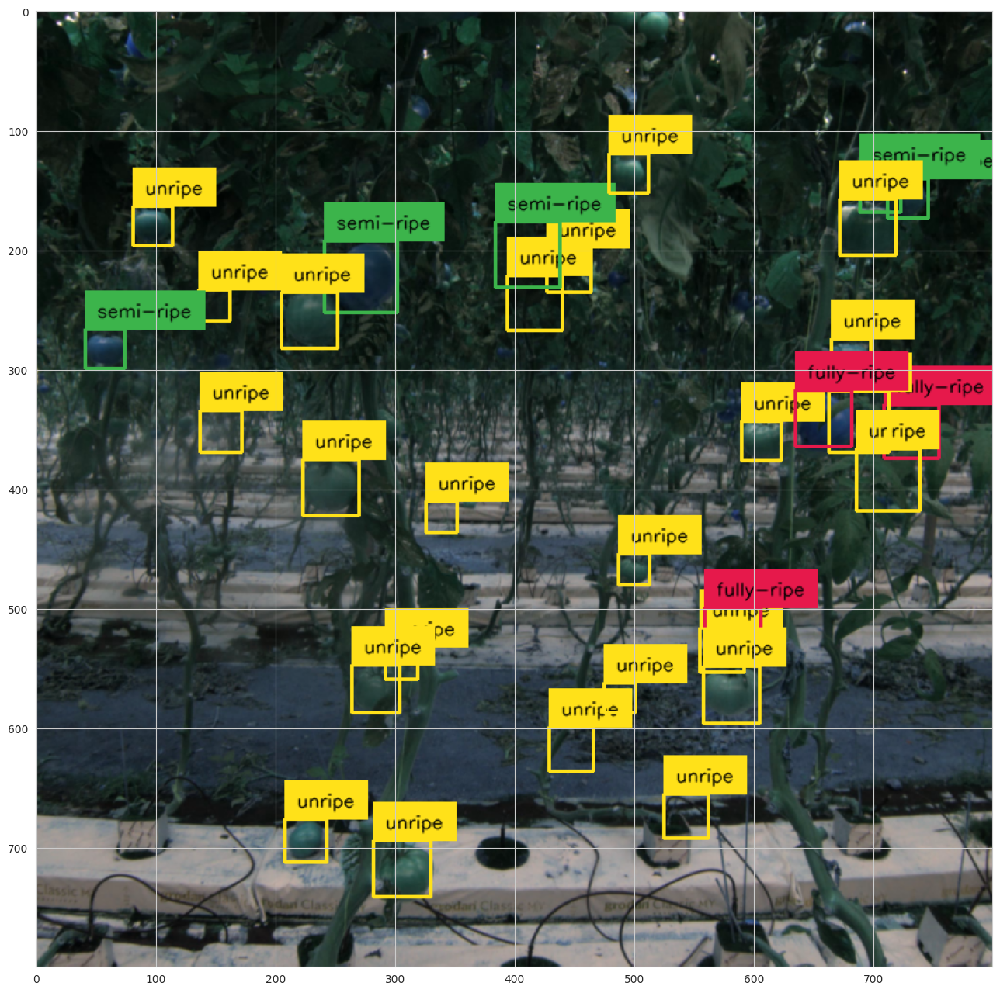

boxes shape: (9, 4)
scores shape: (9,)
class_ids shape: (9,)
Prediction


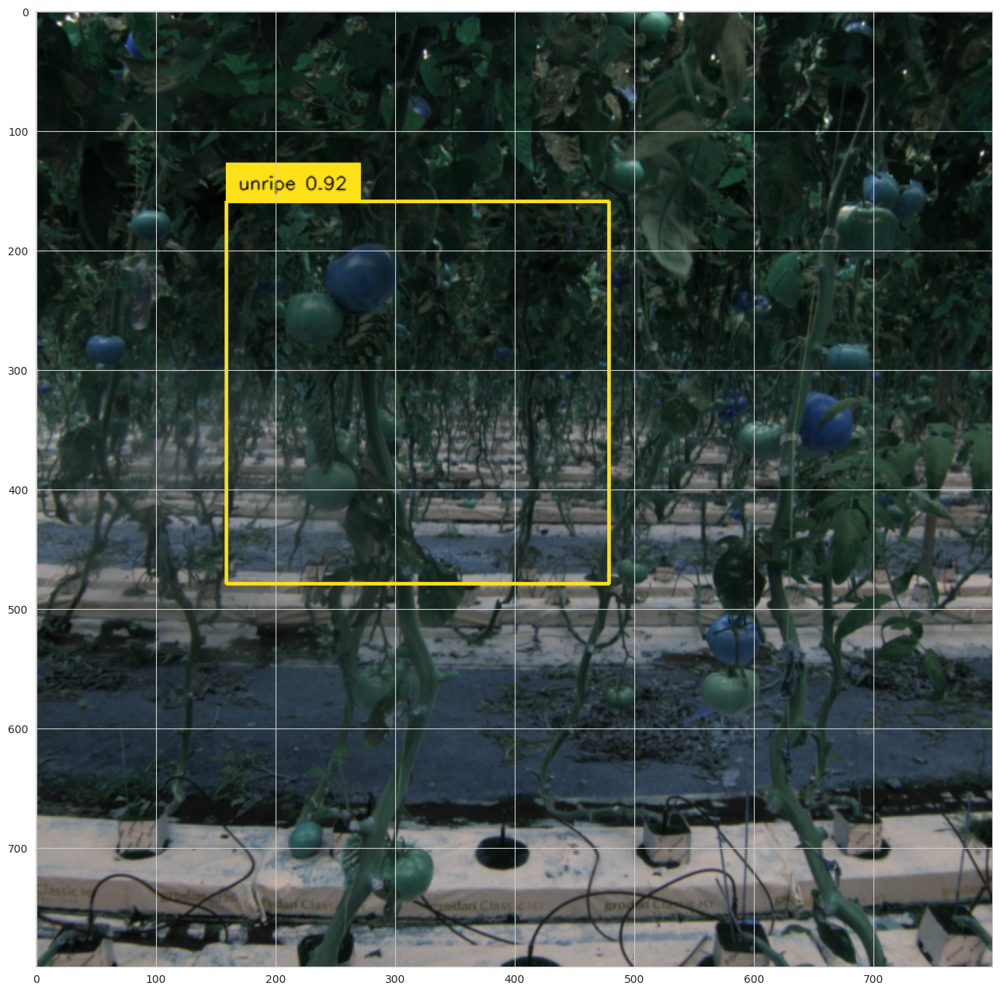

In [ ]:
import random
import cv2
import numpy as np
import torch
import supervision as sv

# utils
label2id = {"fully-ripe": 0, "semi-ripe": 1, "unripe": 2}
id2label = {v: k for k, v in label2id.items()}
box_annotator = sv.BoxAnnotator()

# select random image
index = random.randint(0, len(test_dataset) - 1)
image, target = test_dataset[index]

# --- 處理 image ---
if isinstance(image, torch.Tensor):
    mean = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
    std = torch.tensor([0.229, 0.224, 0.225])[:, None, None]
    image = image * std + mean
    image_np = (image * 255).numpy().transpose(1, 2, 0).astype(np.uint8)

# 假設 Dataset resize 為 (2000, 2000)
resized_h, resized_w = 2000, 2000
original_h, original_w = image_np.shape[:2]
scale_w = original_w / resized_w
scale_h = original_h / resized_h

# 對 boxes 做 scaling
boxes = target["boxes"].cpu().numpy()
boxes[:, [0, 2]] *= scale_w  # x1, x2
boxes[:, [1, 3]] *= scale_h  # y1, y2

# --- Ground Truth ---
detections_gt = sv.Detections(
    xyxy=target["boxes"].cpu().numpy(),
    class_id=target["class_labels"].cpu().numpy()
)
labels_gt = [f"{id2label[c]}" for c in detections_gt.class_id]
frame_gt = box_annotator.annotate(scene=image_np.copy(), detections=detections_gt, labels=labels_gt)

print("Ground Truth")
%matplotlib inline
sv.show_frame_in_notebook(frame_gt, (16, 16))

# --- Prediction ---
with torch.no_grad():
    inputs = image_processor(images=image_np, return_tensors="pt", do_rescale=True).to(DEVICE)
    outputs = model(**inputs)
    target_sizes = torch.tensor([image_np.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=0.5,
        target_sizes=target_sizes
    )[0]

# 手動建立 Detections
boxes = results["boxes"].cpu().numpy()
scores = results["scores"].cpu().numpy().reshape(-1)
class_ids = results["labels"].cpu().numpy().reshape(-1)

print("boxes shape:", boxes.shape)       # (N, 4)
print("scores shape:", scores.shape)     # (N,)
print("class_ids shape:", class_ids.shape)  # (N,)


# 假設 Dataset resize 為 (2000, 2000)
resized_h, resized_w = 2000, 2000
original_h, original_w = image_np.shape[:2]
scale_w = original_w / resized_w
scale_h = original_h / resized_h

# 對 boxes 做 scaling
boxes = results["boxes"].cpu().numpy()
boxes[:, [0, 2]] *= scale_w  # x1, x2
boxes[:, [1, 3]] *= scale_h  # y1, y2

detections_pred = sv.Detections(
    xyxy=boxes,
    confidence=scores,
    class_id=class_ids
).with_nms(threshold=0.5)

labels_pred = [f"{id2label[c]} {conf:.2f}" for _, conf, c, _ in detections_pred]
frame_pred = box_annotator.annotate(scene=image_np.copy(), detections=detections_pred, labels=labels_pred)

print("Prediction")
%matplotlib inline
sv.show_frame_in_notebook(frame_pred, (16, 16))


這個資料集需要一張圖片找出很多個 bbox，理論上 detr 是一個基於 `prediction set` 的物件偵測模型，應該可以得出類似的結果，但這邊由於只跑 50 epochs，模型還沒學好，得到較差的推論結果。  
NOTE: 因為免費版 colab 限制，原本採用 GPU 訓練會較省時 (不然 cpu 光看完一輪就要花半小時)。

Evaluatation
* compared the result with this github repo [link](https://github.com/up2metric/tomatOD)

In [ ]:
!pip install pycocotools

In [ ]:
import json

# 讀取原始 JSON
with open("tomatOD_test.json", "r") as f:
    data = json.load(f)

# 修正 categories 欄位
if isinstance(data["categories"], list) and "name" in data["categories"][0]:
    old_names = data["categories"][0]["name"]  # list: ["unripe", "semi-ripe", "fully-ripe"]
    new_categories = []
    for idx, name in enumerate(old_names, start=1):
        new_categories.append({
            "id": idx,
            "name": name,
            "supercategory": "tomato"
        })
    data["categories"] = new_categories

# 儲存成新的 JSON
with open("tomatOD_test_fixed.json", "w") as f:
    json.dump(data, f)

print("修正後的 JSON 已儲存為 tomatOD_test_fixed.json")

修正後的 JSON 已儲存為 tomatOD_test_fixed.json


In [ ]:
from pycocotools.coco import COCO

# 載入 COCO JSON 檔案
coco = COCO("/content/tomatOD_test_fixed.json")

# 列出所有類別
cat_ids = coco.getCatIds()
categories = coco.loadCats(cat_ids)
print("所有類別：", [cat["name"] for cat in categories])

# 選一個類別的 ID，例如 "fully-ripe"
fully_ripe_id = coco.getCatIds(catNms=["fully-ripe"])[0]


# 拿到這個類別出現的所有 image_id
image_ids = coco.getImgIds(catIds=[fully_ripe_id])
print("包含 fully-ripe 的圖片數量：", len(image_ids))

# 拿一張圖的資訊
img_info = coco.loadImgs(image_ids[0])[0]
print("圖片資訊：", img_info)

# 讀取這張圖上的所有 bounding boxes（標註）
ann_ids = coco.getAnnIds(imgIds=img_info["id"], catIds=[fully_ripe_id], iscrowd=False)
annotations = coco.loadAnns(ann_ids)

# 顯示 bbox 資訊
for ann in annotations:
    print(f"bbox: {ann['bbox']}, 類別ID: {ann['category_id']}")


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
所有類別： ['unripe', 'semi-ripe', 'fully-ripe']
包含 fully-ripe 的圖片數量： 48
圖片資訊： {'file_name': 'stereo20190406_054921_p0_snap_122.jpg', 'height': 2000, 'id': 0, 'width': 2000}
bbox: [1430, 857, 118, 118], 類別ID: 3
bbox: [1443, 1209, 88, 88], 類別ID: 3


In [ ]:
model.eval()
predictions = []

# def convert_to_coco_format(outputs, targets):
#     pred_json = []
#     for output, target in zip(outputs, targets):
#         image_id = target["image_id"].item()
#         bboxes = output["boxes"].cpu().numpy()
#         scores = output["scores"].cpu().numpy()
#         labels = output["labels"].cpu().numpy()

#         for bbox, score, label in zip(bboxes, scores, labels):
#             x, y, x2, y2 = bbox
#             width = x2 - x
#             height = y2 - y
#             pred_json.append({
#                 "image_id": image_id,
#                 "category_id": int(label),
#                 "bbox": [float(x), float(y), float(width), float(height)],
#                 "score": float(score)
#             })
#     return pred_json

# for i, batch in enumerate(test_dataloader):
#     images = batch["pixel_values"].to(DEVICE)
#     pixel_mask = batch["pixel_mask"].to(DEVICE)
#     targets = batch["labels"]

#     # 手動加上 image_id（i 對應 DataLoader 的 batch 編號，須確保順序與 coco json 對應）
#     for t in targets:
#         t["image_id"] = torch.tensor(i)

#     with torch.no_grad():
#         outputs = model(images, pixel_mask=pixel_mask)

#     batch_pred = convert_to_coco_format(outputs, targets)
#     predictions.extend(batch_pred)

# from pycocotools.cocoeval import COCOeval

# # 載入 GT 和 預測結果
# cocoGt = COCO("/content/tomatOD_test_fixed.json")  # Ground Truth
# cocoDt = cocoGt.loadRes(predictions)               # 預測結果

# cocoEval = COCOeval(cocoGt, cocoDt, iouType='bbox')
# cocoEval.evaluate()
# cocoEval.accumulate()
# cocoEval.summarize()

from pycocotools.cocoeval import COCOeval

def convert_to_coco_format(results, targets):
    pred_json = []
    # results is a list of dictionaries, one dictionary per image
    for result, target in zip(results, targets):
        # Ensure 'image_id' exists in the target dictionary
        if "image_id" not in target:
            print("Warning: 'image_id' not found in target. Skipping COCO format conversion for this item.")
            continue

        image_id = target["image_id"].item()
        bboxes = result["boxes"].cpu().numpy()
        scores = result["scores"].cpu().numpy()
        labels = result["labels"].cpu().numpy()

        for bbox, score, label in zip(bboxes, scores, labels):
            x1, y1, x2, y2 = bbox # result['boxes'] are already in xyxy format
            width = x2 - x1
            height = y2 - y1
            pred_json.append({
                "image_id": image_id,
                # Add 1 to label because COCO category IDs are 1-based, not 0-based
                # Ensure label is an integer before adding 1
                "category_id": int(label) + 1,
                "bbox": [float(x1), float(y1), float(width), float(height)],
                "score": float(score)
            })
    return pred_json

model.eval()
predictions = []

# Load GT outside the loop where it is needed to get image IDs
# Make sure the path to the fixed JSON is correct
cocoGt = COCO("/content/tomatOD_test_fixed.json")  # Ground Truth

for i, batch in enumerate(test_dataloader):
    images = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch.get("pixel_mask", None).to(DEVICE)
    targets = batch["labels"]

    # Manually add image_id to targets for COCO evaluation.
    # Ensure the image_id corresponds to the order in the COCO json file.
    # Since the test_dataset was created from files and is loaded sequentially
    # in the DataLoader (shuffle=False), 'i' can serve as a batch index.
    # We need a unique ID for each *image*, not each batch.
    # A better approach is to store the original image index from the dataset
    # in the target dictionary during dataset creation. For now,
    # let's assume the order matches the COCO json images list.
    # We need to assign unique image_ids from the original test set images
    # to the targets. The COCO object `cocoGt` can give us the image IDs.
    # We need to map the DataLoader batch index and item index within the batch
    # back to the original image index in the test_dataset, and then to the
    # corresponding image_id in the cocoGt object.

    # Fetch image IDs from cocoGt based on the batch index.
    # This assumes a direct index mapping, which works if the DataLoader is
    # not shuffled and the test_dataset order matches the COCO json image order.
    start_index = i * test_dataloader.batch_size
    end_index = (i + 1) * test_dataloader.batch_size
    # Ensure indices are within the bounds of the available image IDs
    current_batch_image_ids = cocoGt.getImgIds()[start_index:end_index]

    # Assign the correct image_id from the fetched list to each target in the batch
    for j, t in enumerate(targets):
        if j < len(current_batch_image_ids):
             t["image_id"] = torch.tensor(current_batch_image_ids[j])
        else:
             # Handle cases where batch size might not be a perfect divisor
             print(f"Warning: Image ID not available for item {j} in batch {i}. Skipping image_id assignment.")
             # You might want to skip this item or handle it differently if image_id is crucial

    with torch.no_grad():
        # Pass pixel_mask if needed by the model's forward method
        # Check model definition if pixel_mask is an expected argument
        # The model defined in the notebook expects pixel_mask
        outputs = model(images, pixel_mask=pixel_mask)

    # Use image_processor.post_process_object_detection to get per-image results
    # target_sizes should correspond to the *original* size of the images *before* padding.
    # If the dataset doesn't store original sizes, you need to modify it.
    # For this fix, we are using the padded size as target_sizes, which might be incorrect
    # for proper scaling if original images had different dimensions.
    padded_height, padded_width = images.shape[-2:]
    target_sizes = torch.tensor([[padded_height, padded_width]] * images.shape[0], device=DEVICE)


    # threshold is usually applied here in post_process_object_detection
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=0.0, # Set threshold to 0 here to get all predictions and filter later if needed
        target_sizes=target_sizes
    )

    # results is a list of dictionaries, one per image in the batch
    batch_pred = convert_to_coco_format(results, targets)
    predictions.extend(batch_pred)

# Load Prediction results after the loop finishes
cocoDt = cocoGt.loadRes(predictions)               # Prediction results

# It's good practice to sort the image IDs for COCO evaluation
# Get all image IDs from GT
imgIds = cocoGt.getImgIds()
# Create COCOeval object with specified parameters
# iouType='bbox' is correct for bounding box evaluation
# params = cocoGt.get_eval_params() # You can also get default params and modify
cocoEval = COCOeval(cocoGt, cocoDt, iouType='bbox')
# Set image IDs to evaluate
cocoEval.params.imgIds  = imgIds

# Perform evaluation
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.39s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

unripe AP: 0.00%
semi-ripe AP: 0.00%
fully-ripe AP: 0.00%


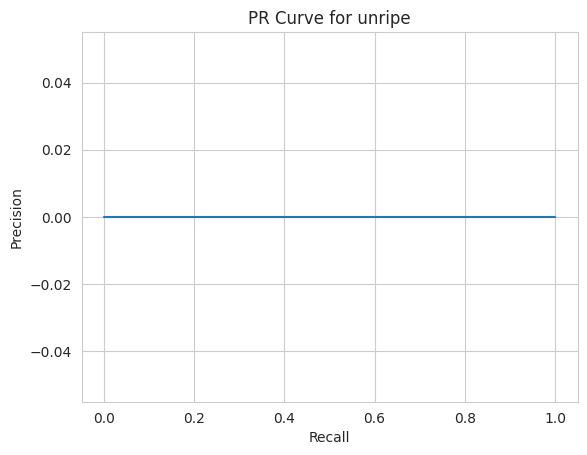

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# precision shape: [IoU_thresh, Recall, Categories, area, maxDets]
precision = cocoEval.eval['precision']
cat_ids = cocoGt.getCatIds()
cat_names = [cat['name'] for cat in cocoGt.loadCats(cat_ids)]

for i, cat_name in enumerate(cat_names):
    # IoU=[0.5:0.95], area=all, maxDets=100
    cat_precision = precision[:, :, i, 0, 2]
    cat_precision = cat_precision[cat_precision > -1]
    ap = np.mean(cat_precision) * 100
    print(f"{cat_name} AP: {ap:.2f}%")

# 畫 PR 曲線（以 unripe 類別為例）
recalls = np.linspace(0, 1, 101)
cat_idx = cat_names.index('unripe')
precisions = precision[0, :, cat_idx, 0, 2]  # IoU=0.5, area=all, maxDets=100
valid = precisions > -1
plt.plot(recalls[valid], precisions[valid])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR Curve for unripe')
plt.show()

save the model

In [ ]:
MODEL_PATH = os.path.join(HOME, 'custom-model')

In [ ]:
model.model.save_pretrained(MODEL_PATH)

load the model

In [ ]:
model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
model.to(DEVICE)

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      